<a href="https://colab.research.google.com/github/sar9ho/artistclassifier/blob/main/ArtClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import random

%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import warnings
warnings.filterwarnings('ignore')

In [ ]:
root = '/content/drive/MyDrive/impclas'

In [ ]:
# Creates artist-specific directory names, and files storing the image names for each artist

artist_lst = ['Cezanne', 'Degas', 'Gauguin', 'Hassam', 'Matisse',
              'Monet', 'Pissarro', 'Renoir', 'Sargent', 'VanGogh']

for artist in artist_lst:
    exec(f"train_{artist}_dir = os.path.join(root, 'training', '{artist}')")
    exec(f"train_{artist}_filenames = os.listdir(train_{artist}_dir)")
    exec(f"valid_{artist}_dir = os.path.join(root, 'validation', '{artist}')")
    exec(f"valid_{artist}_filenames = os.listdir(valid_{artist}_dir)")

In [ ]:
def plot_imgs(artist, nrows=4, ncols=4, num_imgs=8):
    """
    Function to plot random sample images for each artist in a num_rows x num_cols grid
    :param artist: Artist name
    :type artist: str
    :param nrows: Number of rows in grid
    :type nrows: int
    :param ncols: Number of columns
    :type ncols: int
    :param num_imgs: Number of sample images to plot
    :type num_imgs: int
    :return: None
    """

    pic_idx = 0

    fig = plt.gcf()
    fig.set_size_inches(ncols * 6, nrows * 6)

    pic_idx += num_imgs

    train_dir = eval(f"train_{artist}_dir")
    filenames = eval(f"train_{artist}_filenames")
    filenames = random.sample(filenames, len(filenames))

    next_pix = [os.path.join(train_dir, fname)
                    for fname in filenames[pic_idx-num_imgs: pic_idx]]


    for i, img_path in enumerate(next_pix):
        plt.suptitle(f"{artist}", fontsize=24)
        sp = plt.subplot(nrows, ncols, i + 1)
        sp.axis('Off') # Don't show axes (or gridlines)
        img = mpimg.imread(img_path)
        plt.imshow(img)

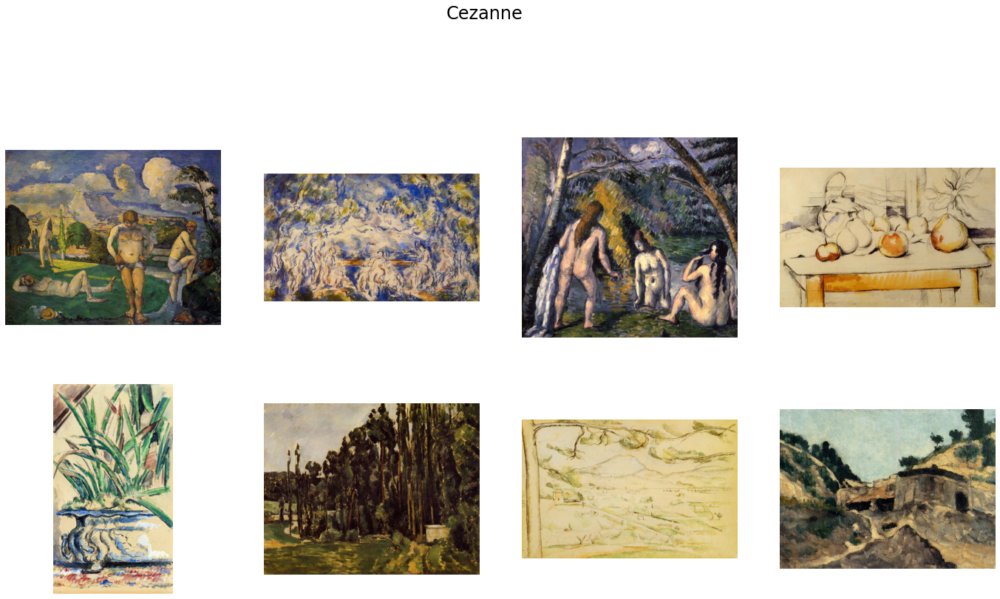

In [ ]:
plot_imgs(artist_lst[0])

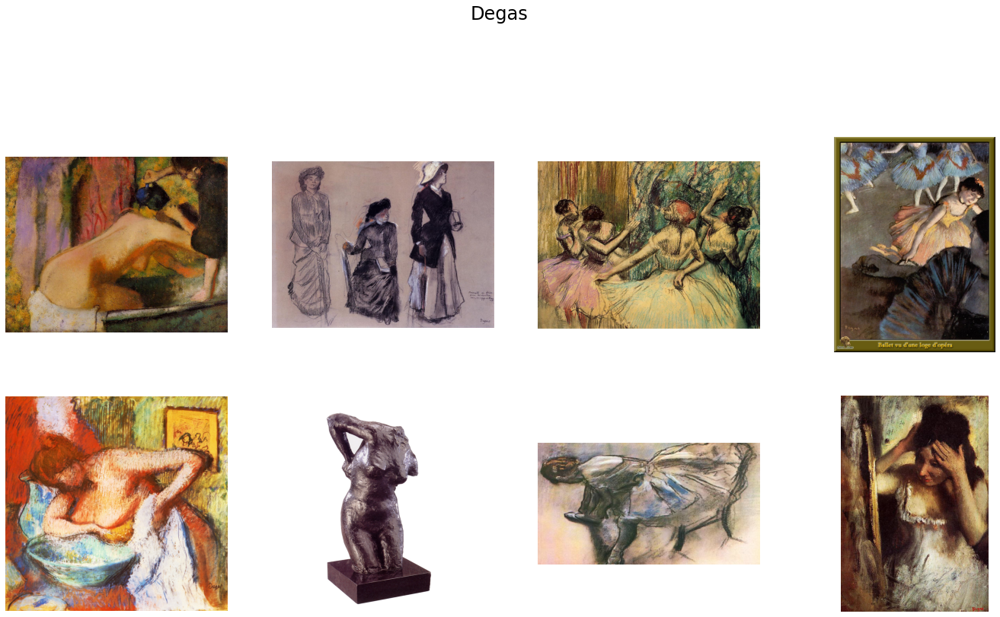

In [ ]:
plot_imgs(artist_lst[1])

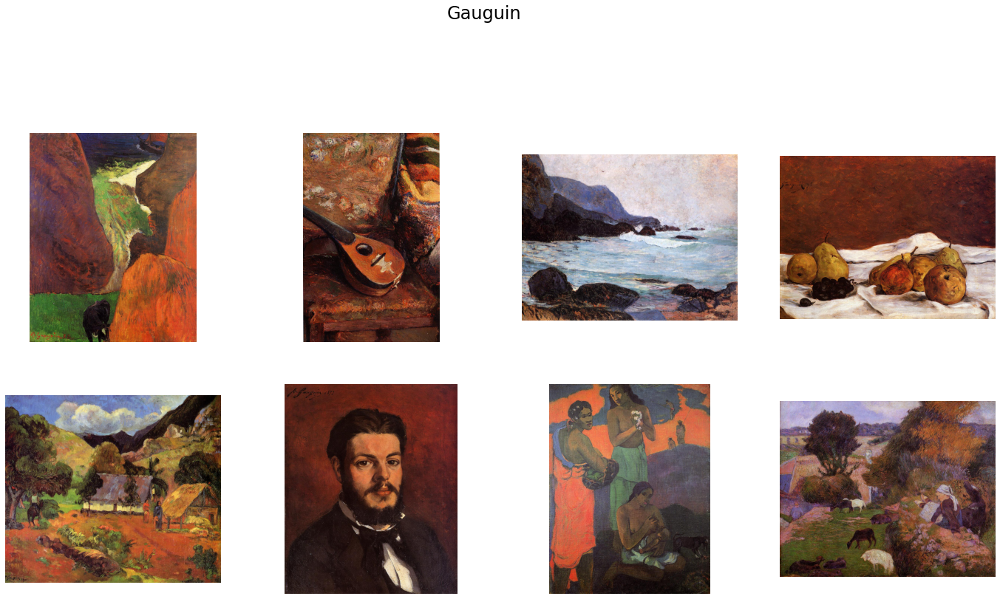

In [ ]:
plot_imgs(artist_lst[2])

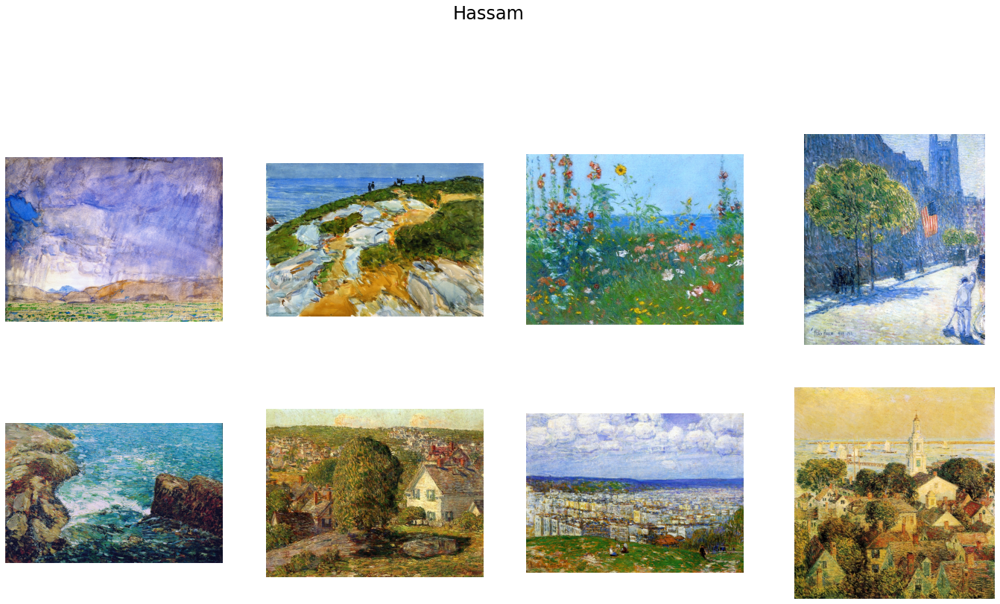

In [ ]:
plot_imgs(artist_lst[3])

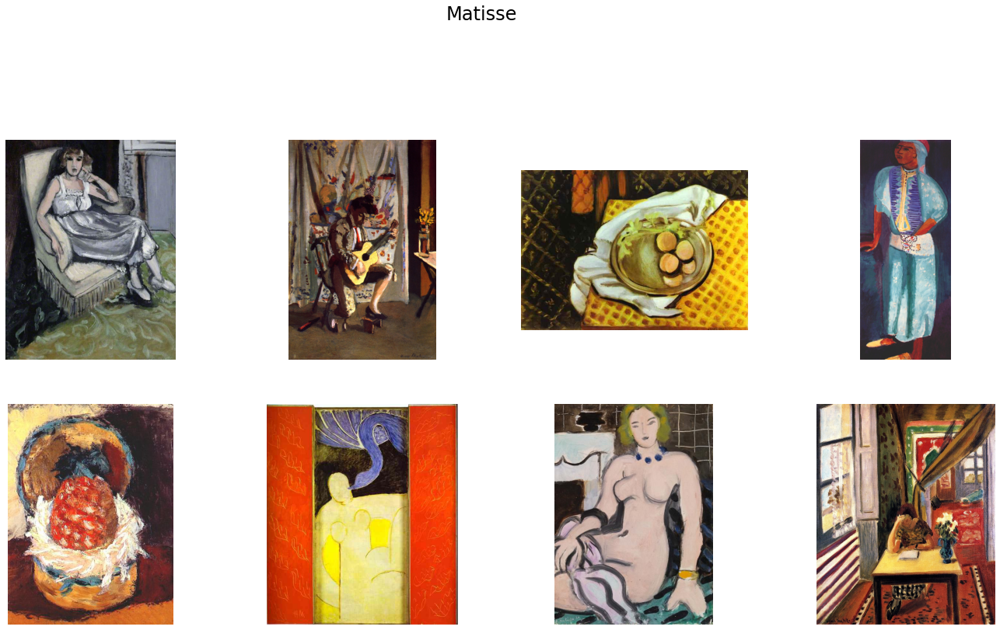

In [ ]:
plot_imgs(artist_lst[4])

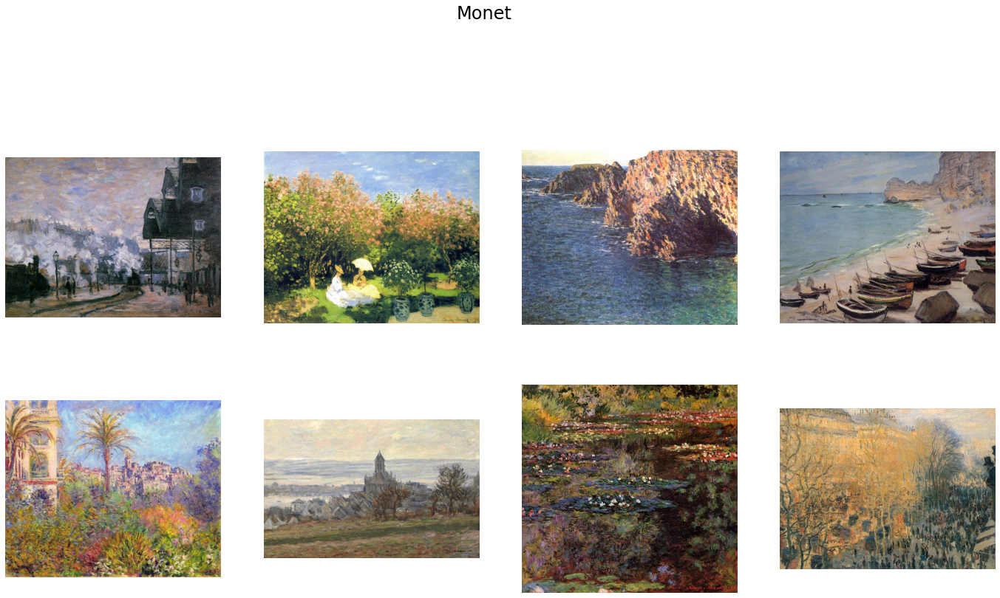

In [ ]:
plot_imgs(artist_lst[5])

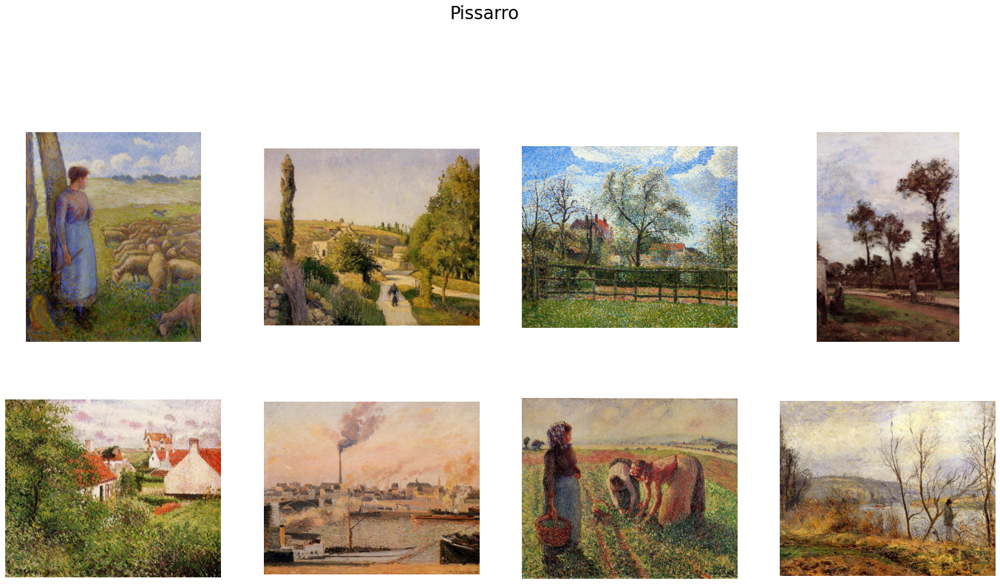

In [ ]:
plot_imgs(artist_lst[6])

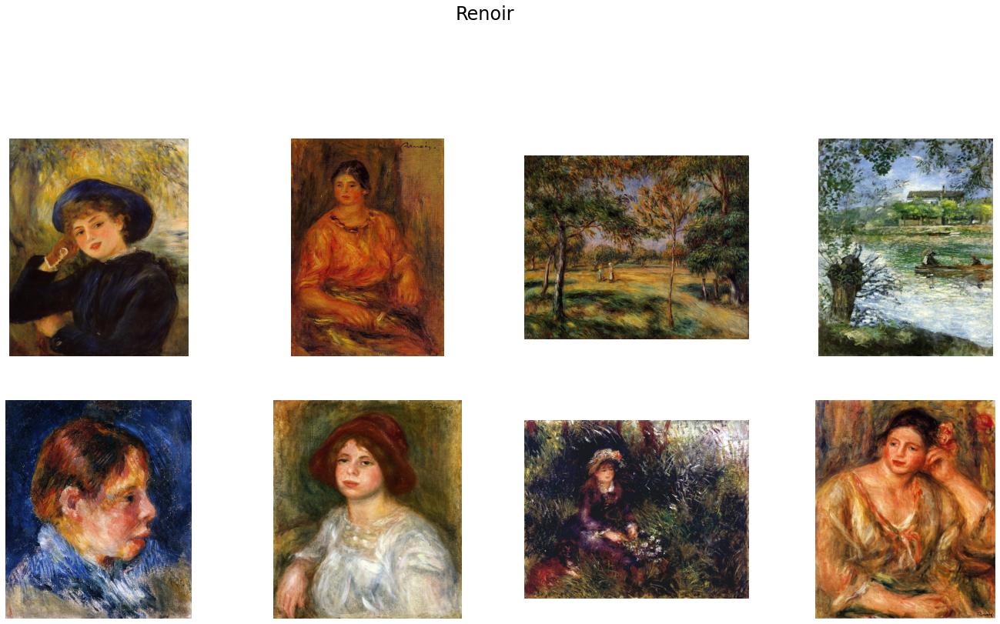

In [ ]:
plot_imgs(artist_lst[7])

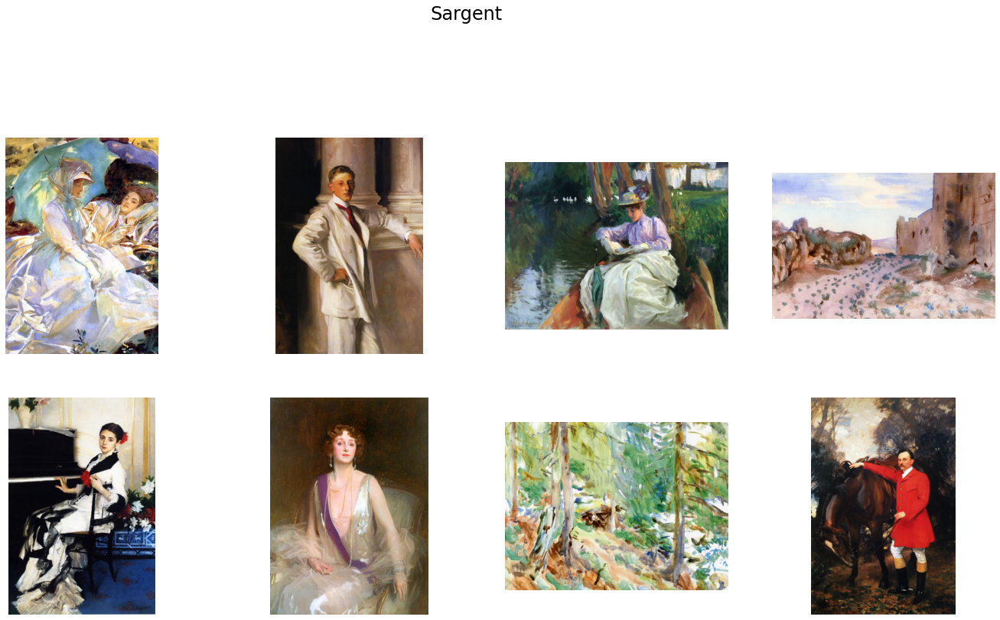

In [ ]:
plot_imgs(artist_lst[8])

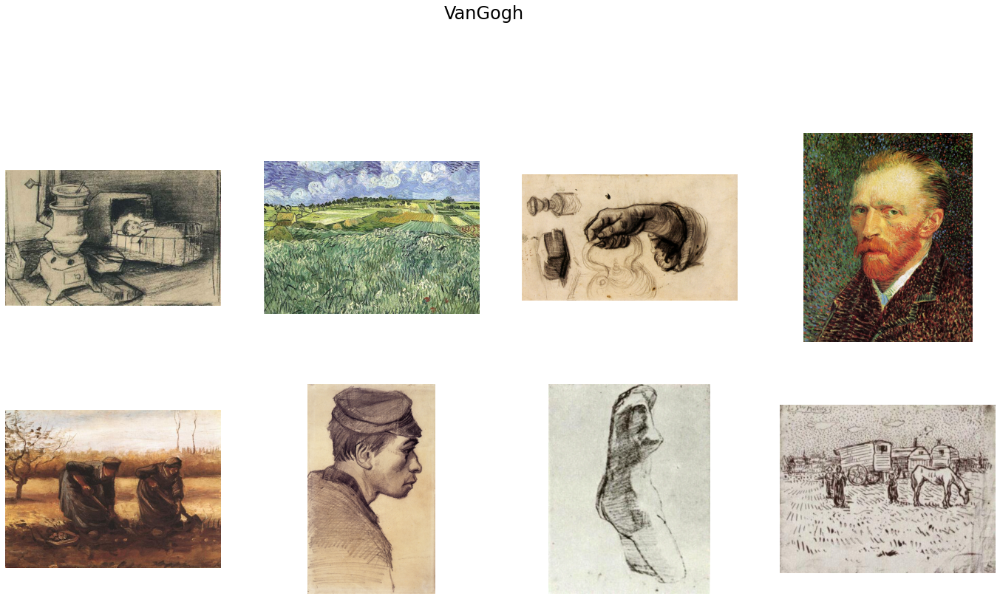

In [ ]:
plot_imgs(artist_lst[9])

In [ ]:
!pip3 install torch torchvision torchaudio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import torch
import torchvision
from torchvision import datasets, models, transforms
import torch.utils.data as data
from torch.utils.tensorboard import SummaryWriter
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import time, os, copy, argparse
import multiprocessing
from matplotlib import pyplot as plt
from torchvision import transforms

In [ ]:
torch.cuda.is_available()


False

In [ ]:
!tf.keras.utils.set_random_seed(seed)

/bin/bash: -c: line 0: syntax error near unexpected token `seed'
/bin/bash: -c: line 0: `tf.keras.utils.set_random_seed(seed)'


In [ ]:

train_directory = '/content/drive/MyDrive/impclas/training'
valid_directory = '/content/drive/MyDrive/impclas/validation'


In [ ]:
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:

image_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'valid': transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
}
# plt.imshow(images[0].permute(1, 2, 0))
# plt.figure()


In [ ]:
# Load data from folders
dataset = {
    'train': datasets.ImageFolder(root=train_directory, transform=image_transforms['train']),
    'valid': datasets.ImageFolder(root=valid_directory, transform=image_transforms['valid'])
}

# Size of train and validation data
dataset_sizes = {
    'train':len(dataset['train']),
    'valid':len(dataset['valid'])
}

In [ ]:
# Create iterators for data loading
bs=64
dataloaders = {
    'train':data.DataLoader(dataset['train'], batch_size=bs, shuffle=True, pin_memory=True, drop_last=True),
    'valid':data.DataLoader(dataset['valid'], batch_size=bs, shuffle=True, pin_memory=True, drop_last=True)
}
# Class names or target labels
class_names = dataset['train'].classes
print("Classes:", class_names)

# Print the train and validation data sizes
print("Training-set size:",dataset_sizes['train'],
      "\nValidation-set size:", dataset_sizes['valid'])
# Set default device as gpu, if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Classes: ['Cezanne', 'Degas', 'Gauguin', 'Hassam', 'Matisse', 'Monet', 'Pissarro', 'Renoir', 'Sargent', 'VanGogh']
Training-set size: 3988 
Validation-set size: 990


In [ ]:
# Loading the pretrained models
model_ft = models.resnet18(pretrained=True)
# Modify fully connected layers to match num_classes
num_ftrs = model_ft.fc.in_features
num_classes = 10
model_ft.fc = nn.Linear(num_ftrs,num_classes )

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
#summary of the models
from torchsummary import summary
print('Model Summary:-\n')
for num, (name, param) in enumerate(model_ft.named_parameters()):
    print(num, name, param.requires_grad )
summary(model_ft, input_size=(3, 224, 224))
print(model_ft)
model_ft = model_ft.to(device)

Model Summary:-

0 conv1.weight True
1 bn1.weight True
2 bn1.bias True
3 layer1.0.conv1.weight True
4 layer1.0.bn1.weight True
5 layer1.0.bn1.bias True
6 layer1.0.conv2.weight True
7 layer1.0.bn2.weight True
8 layer1.0.bn2.bias True
9 layer1.1.conv1.weight True
10 layer1.1.bn1.weight True
11 layer1.1.bn1.bias True
12 layer1.1.conv2.weight True
13 layer1.1.bn2.weight True
14 layer1.1.bn2.bias True
15 layer2.0.conv1.weight True
16 layer2.0.bn1.weight True
17 layer2.0.bn1.bias True
18 layer2.0.conv2.weight True
19 layer2.0.bn2.weight True
20 layer2.0.bn2.bias True
21 layer2.0.downsample.0.weight True
22 layer2.0.downsample.1.weight True
23 layer2.0.downsample.1.bias True
24 layer2.1.conv1.weight True
25 layer2.1.bn1.weight True
26 layer2.1.bn1.bias True
27 layer2.1.conv2.weight True
28 layer2.1.bn2.weight True
29 layer2.1.bn2.bias True
30 layer3.0.conv1.weight True
31 layer3.0.bn1.weight True
32 layer3.0.bn1.bias True
33 layer3.0.conv2.weight True
34 layer3.0.bn2.weight True
35 layer3.0.b

In [ ]:
# Loss function
criterion = nn.CrossEntropyLoss()
# Optimizer
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.8, momentum=0.5)
# Learning rate decay
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=8, gamma=0.3)

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=30):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
# Tensorboard summary
    writer = SummaryWriter()
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

In [ ]:
# Model training routine
print("\nTraining:-\n")

def train_model(model, criterion, optimizer, scheduler, num_epochs=30):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    num_epochs=10
# Tensorboard summary
    writer = SummaryWriter()

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
# Each epoch has a training and validation phase
        for phase in ['train', 'valid']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode
            running_loss = 0.0
            running_corrects = 0
# Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
# zero the parameter gradients
                optimizer.zero_grad()
# forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
# backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
# statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
    print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))
# Record training loss and accuracy for each phase
    if phase == 'train':
        writer.add_scalar('Train/Loss', epoch_loss, epoch)
        writer.add_scalar('Train/Accuracy', epoch_acc, epoch)
        writer.flush()
    else:
        writer.add_scalar('Valid/Loss', epoch_loss, epoch)
        writer.add_scalar('Valid/Accuracy', epoch_acc, epoch)
        writer.flush()
# deep copy the model
    if phase == 'valid' and epoch_acc > best_acc:
        best_acc = epoch_acc
        best_model_wts = copy.deepcopy(model.state_dict())
    print()
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    # load best model weights
    model.load_state_dict(best_model_wts)
    return model
    model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,num_epochs=num_epochs)
    # Save the model
PATH="model_5.pth"
print("\nSaving the model...")
torch.save(model_ft, PATH)


Training:-


Saving the model...


In [ ]:
import numpy as np
import torch
import torchvision
from torchvision import datasets, models, transforms
import torch.utils.data as data
import multiprocessing
from sklearn.metrics import confusion_matrix
#Loading the testing images
#Loading the saved model
EVAL_MODEL= '/content/model_1.pth'
model = torch.load(EVAL_MODEL)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
bs = 8
EVAL_DIR= '/content/drive/MyDrive/impclas/validation'


# Prepare the eval data loader
eval_transform=transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])])
eval_dataset=datasets.ImageFolder(root=EVAL_DIR, transform=eval_transform)
eval_loader=data.DataLoader(eval_dataset, batch_size=bs, shuffle=True, pin_memory=True)
# Enable gpu mode, if cuda available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# Number of classes and dataset-size
num_classes=len(eval_dataset.classes)
dsize=len(eval_dataset)
# Class label names
class_names=['Cezanne', 'Degas', 'Gauguin', 'Hassam', 'Matisse', 'Monet', 'Pissarro', 'Renoir', 'Sargent', 'VanGogh']
# Initialize the prediction and label lists
predlist=torch.zeros(0,dtype=torch.long, device='cpu')
lbllist=torch.zeros(0,dtype=torch.long, device='cpu')
# Evaluate the model accuracy on the dataset
correct = 0
total = 0
with torch.no_grad():
    for images, labels in eval_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        predlist=torch.cat([predlist,predicted.view(-1).cpu()])
        lbllist=torch.cat([lbllist,labels.view(-1).cpu()])
# Overall accuracy
overall_accuracy=100 * correct / total
print('Accuracy of the network on the {:d} test images: {:.2f}%'.format(dsize,
    overall_accuracy))
# Confusion matrix
conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
print('Confusion Matrix')
print('-'*16)
print(conf_mat,'\n')

Accuracy of the network on the 990 test images: 8.99%
Confusion Matrix
----------------
[[10 20  0 42 12  8  0  2  4  1]
 [ 7 18  0 69  3  1  0  1  0  0]
 [ 7 20  0 41 13 15  0  0  2  1]
 [ 5 30  1 32 10  7  1  6  2  5]
 [ 6 17  1 51  5 18  0  0  1  0]
 [ 4 29  1 29 12 13  1  5  3  2]
 [ 3 21  0 36 17  6  0  1 11  4]
 [ 4 11  0 77  2  0  1  3  0  1]
 [ 8 24  0 49 13  1  0  2  0  2]
 [ 6 17  1 51  6  5  1  0  4  8]] 

